# MIT License

Copyright (c) 2023 Thranathi Reddy Chada

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

# **H20 AutoML Indian Hotels on Goibibo**

## Importing required Libraries and H20 Initialization
The process of automating machine learning's end-to-end application to real-world issues is known as automated machine learning, or AutoML.

H2O AutoML automates the steps like basic data processing, model training and tuning, Ensemble and stacking of various models to provide the models with the best performance so that developers can focus on other steps like data collection, feature engineering and deployment of model.

We are initializing H2O in the following steps.

In [1]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install --upgrade matplotlib

In [2]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


In [3]:
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import sklearn
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [4]:
min_mem_size=6
run_time=222

In [5]:
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)


0


In [6]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)
#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:31309..... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) 64-Bit Server VM (build 19.0.2+7-44, mixed mode, sharing)
  Starting server from C:\Users\thran\anaconda3\Lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\thran\AppData\Local\Temp\tmpbwui_9l5
  JVM stdout: C:\Users\thran\AppData\Local\Temp\tmpbwui_9l5\h2o_thran_started_from_python.out
  JVM stderr: C:\Users\thran\AppData\Local\Temp\tmpbwui_9l5\h2o_thran_started_from_python.err
  Server is running at http://127.0.0.1:31309
Connecting to H2O server at http://127.0.0.1:31309 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,America/New_York
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.42.0.3
H2O_cluster_version_age:,2 months and 11 days
H2O_cluster_name:,H2O_from_python_thran_w3tbf0
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,1.959 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


In [7]:
# Import the processed data from notebook One
url = "https://raw.githubusercontent.com/thranathi17/dsem_dataset/main/goibibo_com-travel_new.csv"
df = h2o.import_file(path = url)
dff = pd.read_csv("https://raw.githubusercontent.com/thranathi17/dsem_dataset/main/goibibo_com-travel_new.csv")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [8]:
dff.head(5)

,address,area,city,guest_recommendation,hotel_description,hotel_facilities,latitude,locality,longitude,property_id,property_name,property_type,province,room_count,room_type,site_review_count,site_review_rating,state,uniq_id
0,"15th Mile, N.H.21,Manali, District Kullu,Himac...",Others,Manali,85,The standard check-in time is 12:00 PM and the...,Doctor on Call|Dry Cleaning|Laundry Service Av...,32.139387,Others,77.154660,HTLGBO1000016238,Baragarh Regency,Resort,Manali,17,Deluxe Room,87,4.0,Himachal Pradesh,2c8db027d43a9452a43e88eb30d9f983
1,"A-585, Sushant Lok-1 ,Near Iffco Chowk Metro S...",Sushant Lok,Gurgaon,87,The standard check-in time is 12:00 PM and the...,Airport Transfer Available / Surcharge|Banquet...,28.472097,Sushant Lok,77.072546,HTLGBO1000015822,Asian Suites A- 585,Guest House,Gurgaon,18,Deluxe Room With Free WIFI,8,4.5,Haryana,e98f69f889c0235e6dc480e7df6de0de
2,"Cobra Vaddo,Calungate Baga Road, Bardez, Calan...",Calangute Area,Goa,50,The standard check-in time is 12:00 PM and the...,Swimming Pool|Bar / Lounge |Laundry Service Av...,15.548398,Calangute Area,73.757634,HTLGBO1000004551,Bevvan Resort,Resort,Goa,15,Standard Room,2,2.5,Goa,9b59d00eaffc273d83000ed7dcda0e83
3,Simsa,Village Simsa,Manali,100,The standard check-in time is 12:00 PM and the...,Doctor on Call|Dry Cleaning|Laundry Service Av...,32.223603,Village Simsa,77.185900,HTLGBO1000007993,Apple Inn Cottage,Cottage,Manali,24,Deluxe Room,1,5.0,Himachal Pradesh,df0971f9c5501af112485ee28b468ce5
4,"8180 Street No.-6,Arakashan Road,Paharganj",Paharganj,Delhi,63,The standard check-in time is 12:00 PM and the...,Internet Access - Surcharge|Laundry Service Av...,28.646777,Paharganj,77.212735,HTLGBO1000008281,Anmol Hotel Pvt.Ltd,Hotel,Delhi,20,Standard Room Non AC,121,2.8,Delhi,0c3514344c9cda8718f558e84bdb44ef


In [9]:
#Dropping the columns that is not needed for creating predective model

dff.drop('province', axis=1 , inplace=True)
dff.drop('locality', axis=1, inplace=True)
#dff.drop('address', axis=1, inplace=True)
#dff.drop('hotel_description', axis=1, inplace=True)
#dff.drop('hotel_facilities', axis=1, inplace=True)

In [10]:
#Gettig the list of numerical features
num_cols = dff._get_numeric_data().columns
num_cols, len(num_cols)

(Index(['guest_recommendation', 'latitude', 'longitude', 'room_count',
        'site_review_count', 'site_review_rating'],
       dtype='object'),
 6)

In [11]:
#Gettig the list of categorical features
cat_cols = dff.select_dtypes(include=['object']).columns.tolist()
cat_cols, len(cat_cols)

(['address',
  'area',
  'city',
  'hotel_description',
  'hotel_facilities',
  'property_id',
  'property_name',
  'property_type',
  'room_type',
  'state',
  'uniq_id'],
 11)

In [12]:
# converting categorical features into numerical
for cat_col in cat_cols:
  classes = list(np.unique(dff[cat_col]))
  tokens = []
  i = 0
  for c in classes:
    tokens.append(i)
    i += 1

  dff[cat_col].replace(classes, tokens, inplace=True)

In [13]:
dff.head()

,address,area,city,guest_recommendation,hotel_description,hotel_facilities,latitude,longitude,property_id,property_name,property_type,room_count,room_type,site_review_count,site_review_rating,state,uniq_id
0,164,585,214,85,723,1132,32.139387,77.154660,1278,43,13,17,241,87,4.0,10,396
1,546,798,120,87,778,141,28.472097,77.072546,1268,24,5,18,261,8,4.5,9,2116
2,830,108,113,50,510,2146,15.548398,73.757634,480,50,13,15,695,2,2.5,7,1385
3,2017,877,214,100,723,1152,32.223603,77.185900,789,13,3,24,241,1,5.0,10,2013
4,493,591,87,63,1262,1620,28.646777,77.212735,810,8,8,20,709,121,2.8,6,115


In [14]:
dff.isnull().sum()  # Checking for any null values in the dataset, as we hav no null values - we are good to go.

address                 0
area                    0
city                    0
guest_recommendation    0
hotel_description       0
hotel_facilities        0
latitude                0
longitude               0
property_id             0
property_name           0
property_type           0
room_count              0
room_type               0
site_review_count       0
site_review_rating      0
state                   0
uniq_id                 0
dtype: int64

In [15]:
dff.describe()  # Statistical description of our dataset

,address,area,city,guest_recommendation,hotel_description,hotel_facilities,latitude,longitude,property_id,property_name,property_type,room_count,room_type,site_review_count,site_review_rating,state,uniq_id
count,2302.000000,2302.000000,2302.000000,2302.000000,2302.000000,2302.000000,2302.000000,2302.000000,2302.000000,2302.000000,2302.000000,2302.000000,2302.000000,2302.000000,2302.000000,2302.000000,2302.000000
mean,1148.859687,448.908341,164.575586,75.976977,716.264553,1121.462641,21.477707,77.385076,1150.500000,1093.726325,8.735882,29.614683,418.634666,48.876195,3.769983,14.800174,1150.500000
std,663.245513,258.398243,102.630416,22.060363,366.671713,636.455640,7.543358,4.477159,664.674482,624.362846,2.687507,125.602858,231.087313,94.350157,0.819890,6.906845,664.674482
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.080476,12.939682,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,575.250000,211.000000,86.000000,68.000000,429.000000,573.250000,15.208563,74.640032,575.250000,571.250000,8.000000,10.000000,241.000000,4.000000,3.400000,9.000000,575.250000
50%,1149.500000,460.000000,143.000000,80.000000,723.000000,1139.500000,22.516101,77.056976,1150.500000,1075.500000,8.000000,20.000000,380.000000,17.000000,4.000000,14.000000,1150.500000
75%,1722.750000,639.750000,248.000000,90.000000,1017.000000,1657.750000,28.443529,78.154690,1725.750000,1631.750000,8.000000,32.750000,671.750000,57.000000,4.300000,21.000000,1725.750000
max,2297.000000,918.000000,361.000000,100.000000,1370.000000,2228.000000,79.464811,94.911962,2301.000000,2197.000000,16.000000,5874.000000,834.000000,2094.000000,5.000000,26.000000,2301.000000


In [16]:
dff.corr() #Calculating correlation matrix for all variables

,address,area,city,guest_recommendation,hotel_description,hotel_facilities,latitude,longitude,property_id,property_name,property_type,room_count,room_type,site_review_count,site_review_rating,state,uniq_id
address,1.000000,0.114702,0.132766,-0.012108,-0.039966,0.100397,0.080850,-0.007714,0.016971,0.025922,0.092282,0.027455,-0.030963,-0.038499,-0.000085,-0.011777,0.031303
area,0.114702,1.000000,0.092166,0.031544,0.005827,0.045025,0.099755,0.026015,0.023608,0.041141,0.064665,-0.000278,0.004184,-0.047548,-0.003676,0.061504,-0.031552
city,0.132766,0.092166,1.000000,0.028441,0.003127,0.036372,0.026101,0.027888,0.012653,0.018916,0.055275,-0.008341,0.023042,0.000700,0.022095,0.049393,-0.009771
guest_recommendation,-0.012108,0.031544,0.028441,1.000000,-0.065130,0.019865,-0.041128,-0.067413,0.042410,0.029328,0.028896,0.011002,0.015102,0.075590,0.544301,-0.012492,-0.005524
hotel_description,-0.039966,0.005827,0.003127,-0.065130,1.000000,-0.150461,0.150035,0.095467,0.014461,-0.001562,-0.129235,0.014304,0.013576,-0.034609,-0.117650,0.009391,-0.021154
hotel_facilities,0.100397,0.045025,0.036372,0.019865,-0.150461,1.000000,-0.100799,-0.046937,0.094480,-0.017063,0.194086,-0.011543,0.029341,-0.075554,-0.019283,0.010614,-0.000781
latitude,0.080850,0.099755,0.026101,-0.041128,0.150035,-0.100799,1.000000,-0.017601,0.024596,0.002933,-0.135767,0.001598,-0.010463,-0.028052,-0.047139,0.085554,-0.006163
longitude,-0.007714,0.026015,0.027888,-0.067413,0.095467,-0.046937,-0.017601,1.000000,0.015985,-0.013364,-0.023331,-0.033816,0.000717,-0.011808,-0.057932,0.139740,0.024190
property_id,0.016971,0.023608,0.012653,0.042410,0.014461,0.094480,0.024596,0.015985,1.000000,0.036398,-0.146997,-0.040274,-0.001849,-0.250584,-0.114912,-0.056598,0.005082
property_name,0.025922,0.041141,0.018916,0.029328,-0.001562,-0.017063,0.002933,-0.013364,0.036398,1.000000,-0.029411,0.032709,0.045945,0.020175,0.060066,-0.008530,0.047107


#Representing the same matrix in form of heatmap where shades of blue signify inverse relation and shades of red signify direct relation.

Text(0.5, 1.0, 'Variable Correlation')

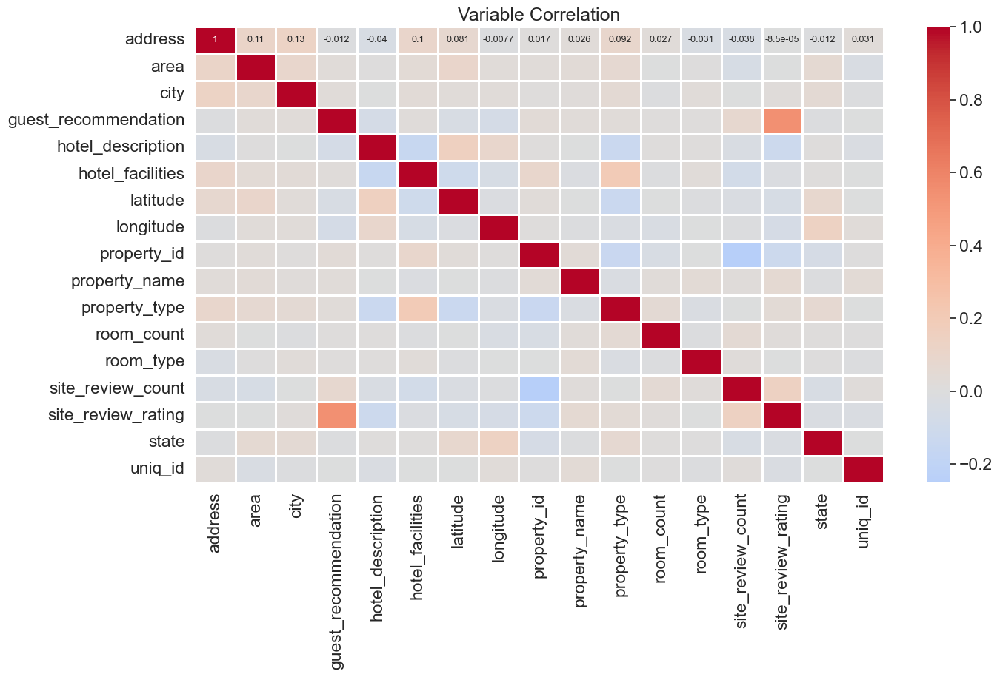

In [17]:
#Representing Matrix as a plot
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(15,8))

sns.heatmap(dff.corr(),center=0, linewidths=0.8,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Variable Correlation')


# Correlation Analysis
The correlation between the various features in the dataset is shown graphically above. The heatmap shows a matrix of colors that indicate how strongly variables are correlated with one another.

A correlation coefficient, like the Pearson correlation coefficient, can be used to determine the correlation between two sets of variables. The linear link between two variables is measured by this coefficient, which has values ranging from -1 (perfect negative correlation) to 1 (perfect positive correlation). A correlation of 0 means there is none.

The correlation coefficients are shown as colors in a matrix in the heatmap above, where each variable is shown on both the x and y axes. With a color scale ranging from low to high, each cell's color in the matrix represents the degree of correlation between the matching pair of variables.

A correlation heatmap can help in the identification of the relationships between pairs of variables in a dataset.It can be used to find trends and patterns as well as highly connected (positively or negatively) variables. Both exploratory data analysis and the identification of possible predictors in statistical models can benefit from this information.

Plotting every variable against every other variable to determine whether a relationship exists. It essentially provides the same information as a correlation matrix, but visually.

We can infer from the Above Matrix that there is a strong correlation between guest suggestion and site review rating.



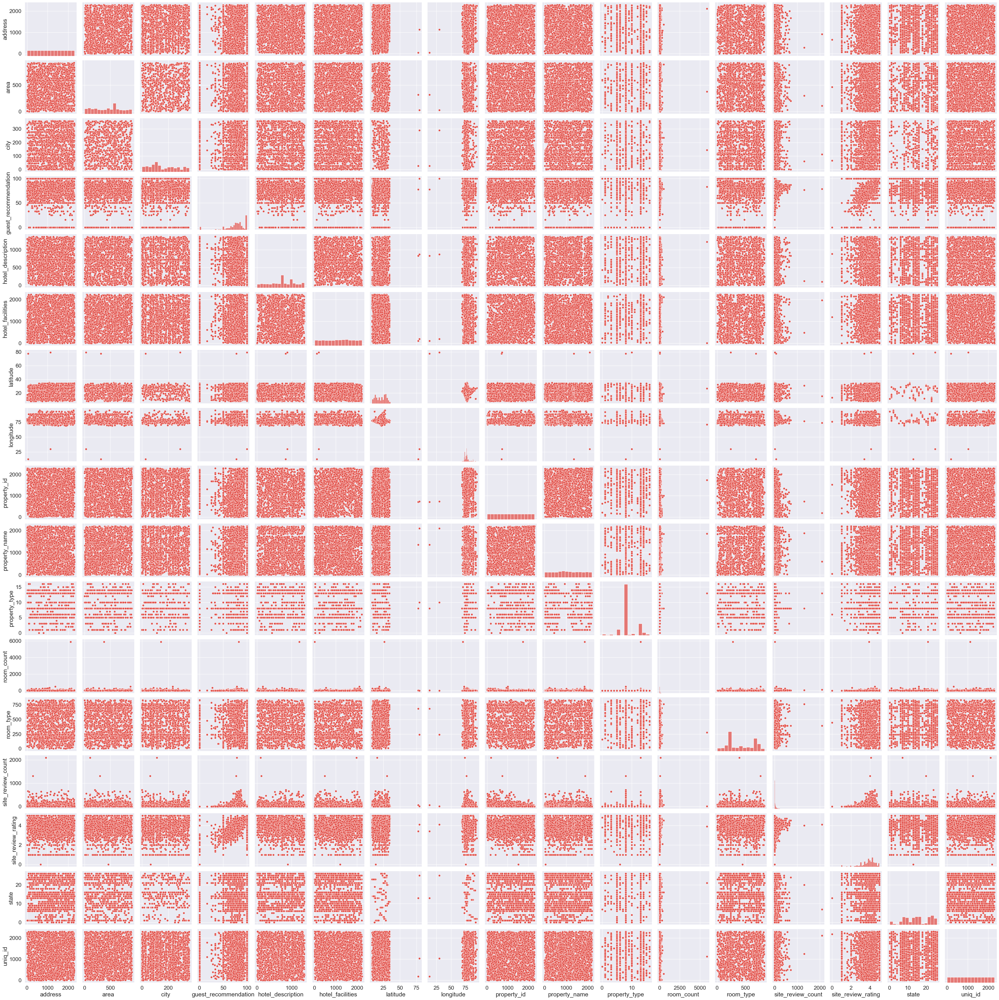

In [18]:
sns.pairplot(
    dff
)  # All attributes are plotted against each other to see the pattern of distribution

# Interpreting PairPlot
The pairwise relationships between variables in a dataset are shown graphically in a pair plot. It shows scatter plots for every two-variable pair.

Relationship between variables: The relationships between pairs of variables are displayed in the scatter plots. When two variables exhibit significant correlation, a strong linear link between them will be shown in the scatter plot. A random distribution of points will be displayed in the scatter plot if there is no correlation between the variables. Finding variables with a significant positive or negative association might be aided by the pair plot.

Distribution of variables: Each variable's distribution is displayed by the histograms. The histogram for a variable with a normal distribution will have a bell shape. A skewed variable will result in an asymmetric histogram. Identifying variables with non-normal distributions or outliers can be aided by the pair plot.

Outliers: Any potential outliers in the dataset can be seen using the scatter plots. Data points that deviate significantly from the norm are known as outliers, and they can significantly affect statistical models.

Patterns and trends: The data can be analyzed to find patterns and trends by looking at the scatter plots. For instance, it is evident that there is a nonlinear relationship or that the relationship between two variables varies with time.

Potential predictors: Variables that could be used as predictors for a statistical model can be found by looking at the scatter plots. Strong correlations between variables and the target variable could make them useful predictors for the model.

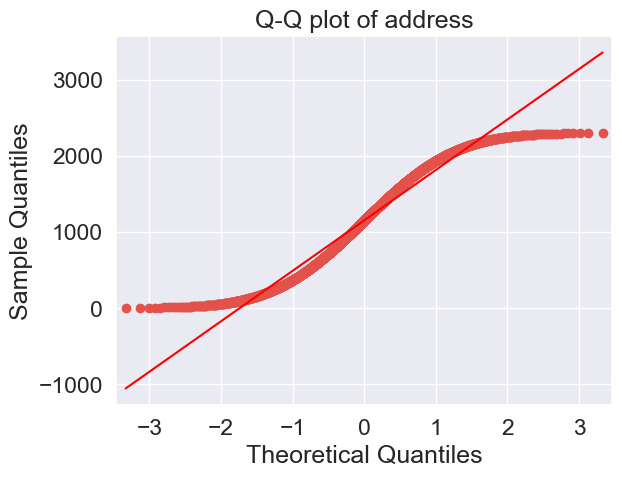

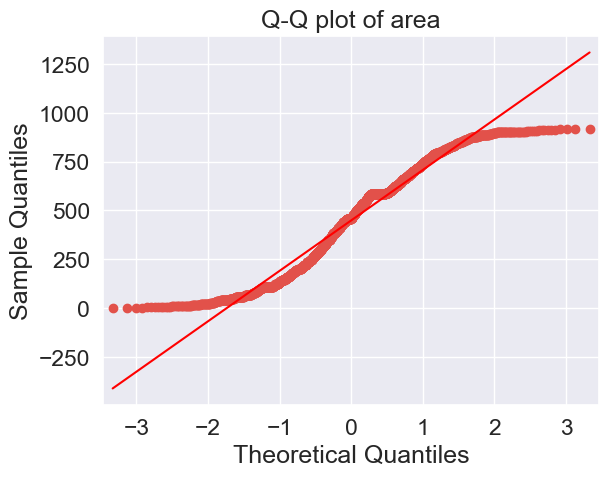

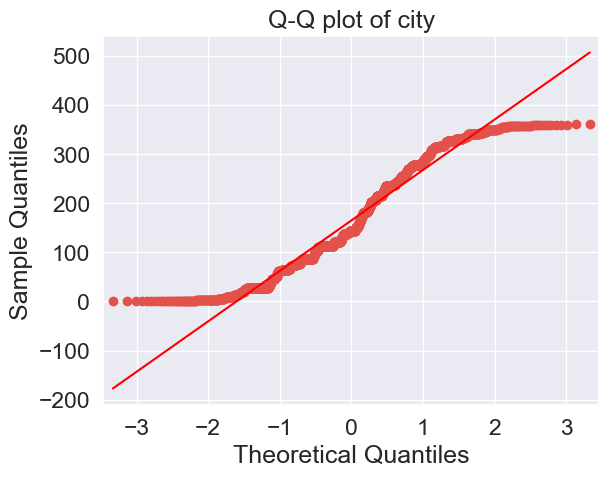

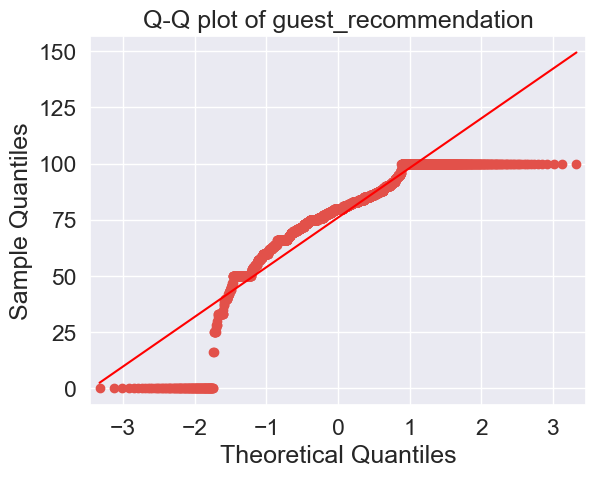

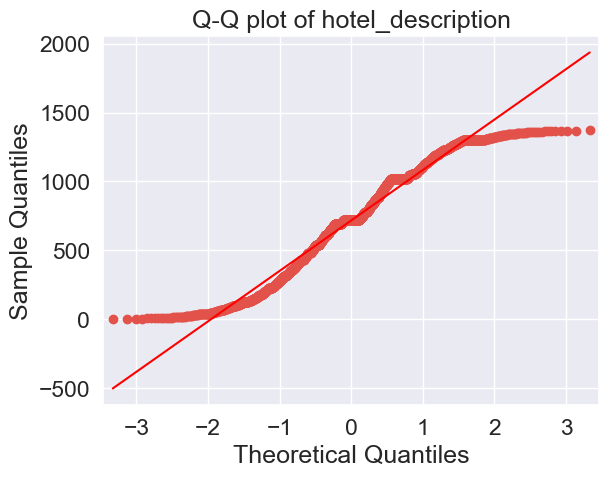

...

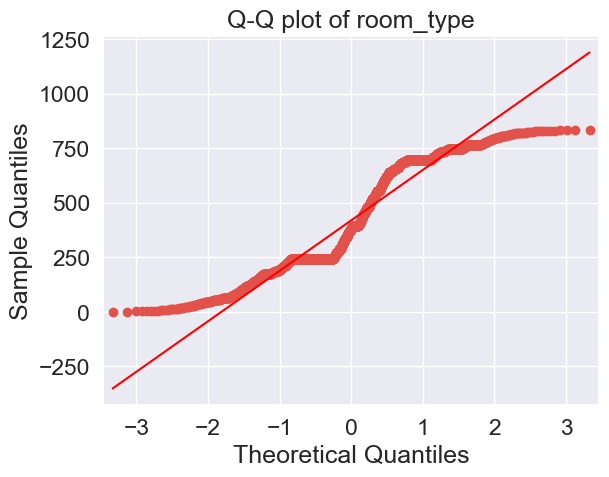

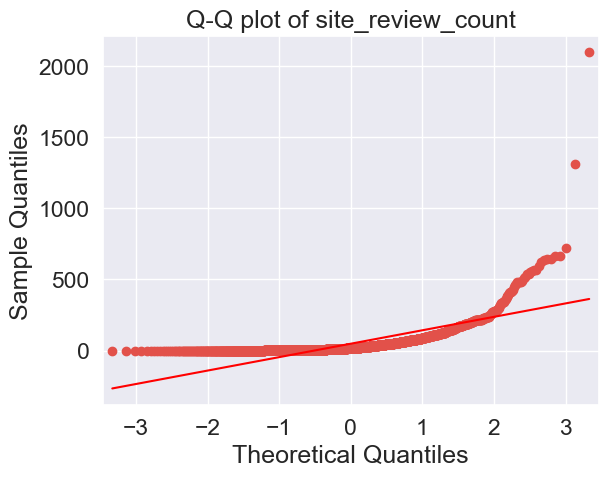

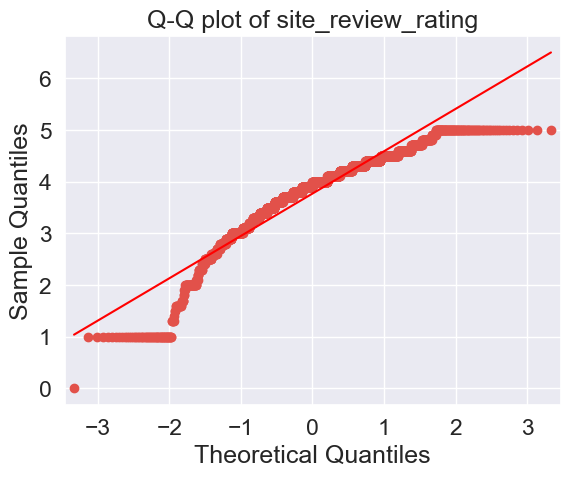

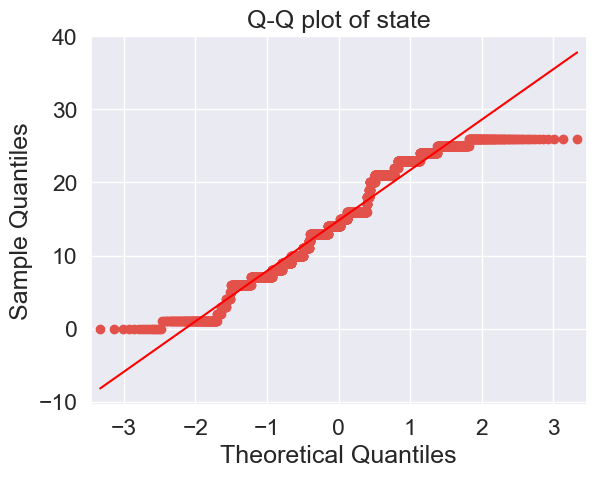

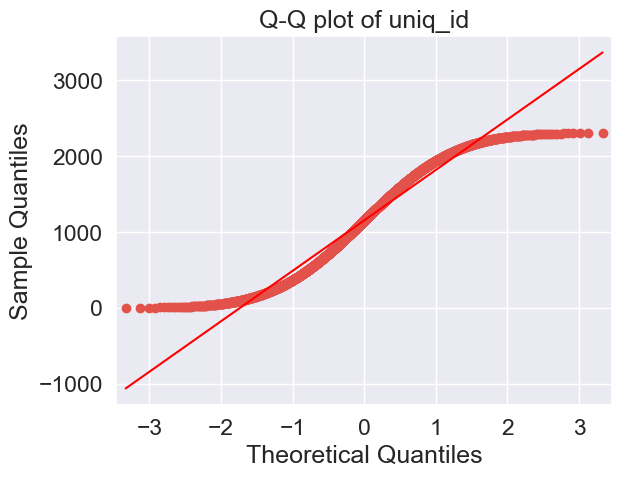

In [19]:
import statsmodels.api as sm
for col in dff.columns:
    sm.qqplot(dff[col], line='s')
    plt.title('Q-Q plot of ' + col)
    plt.show()

1 – Area: The distribution of area in goibibo appears to be approximately normally distributed

2 - City: The distribution of city in goibibo appears to be approximately normally distributed

3 – Guest recommendation: The distribution of Guest recommendation in goibibo appears to be skewed to the right

4 -Latitude: The distribution of Latitude in goibibo is positively skewed

5 – Property ID: The distribution of Property ID in gibibo appears to be skewed to the right

6 – Property Name: The distribution of Property Name in gibibo appears to be
positively skewed

7 – Property type: The distribution of total sulfur dioxide in red wines appears to be positively skewed

8 – Room count : The distribution of Room count in goibibo is exponential distributed

9 – Room Type: The distribution of pH in red wines is normally distributed

10 – Site_review_count: The distribution of Room count in goibibo is exponential distributed

11 – Site_review_rating: The distribution of chlorides in red wines appears to be skewed to the right

12 – State: The distribution of State in goibibo appears to be approximately normally distributed

13 – uniq_id: The distribution of uniq_id in goibibo appears to be approximately normally distributed

14 – Address: The distribution of address in goibibo appears to be approximately normally distributed

15 – Hotel description: The distribution of Hotel description in goibibo appears to be approximately skewed to the right

16 – Hotel facilities: The distribution of Hotel facilities in goibibo appears to be approximately normally distributed


In [20]:
df = h2o.H2OFrame(
    dff
)  # Converted Pandas Dataframe to H2O dataframe to proceed with AutoML

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [21]:
df.types

{'address': 'int',
 'area': 'int',
 'city': 'int',
 'guest_recommendation': 'int',
 'hotel_description': 'int',
 'hotel_facilities': 'int',
 'latitude': 'real',
 'longitude': 'real',
 'property_id': 'int',
 'property_name': 'int',
 'property_type': 'int',
 'room_count': 'int',
 'room_type': 'int',
 'site_review_count': 'int',
 'site_review_rating': 'real',
 'state': 'int',
 'uniq_id': 'int'}

In [22]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = df.split_frame([pct_rows])

In [23]:
print(df_train.shape)
print(df_test.shape)

(1822, 17)
(480, 17)


In [24]:
df_train.head()

address,area,city,guest_recommendation,hotel_description,hotel_facilities,latitude,longitude,property_id,property_name,property_type,room_count,room_type,site_review_count,site_review_rating,state,uniq_id
2017,877,214,100,723,1152,32.2236,77.1859,789,13,3,24,241,1,5,10,2013
493,591,87,63,1262,1620,28.6468,77.2127,810,8,8,20,709,121,2.8,6,115
658,56,113,68,192,225,15.5609,73.7498,282,40,13,15,617,16,3.9,7,1312
265,348,87,76,1017,549,28.6506,77.1947,9,32,8,24,125,550,4,6,42
499,585,143,0,127,1423,26.9048,75.7489,2024,19,6,2,723,1,3,21,45
609,685,122,90,1315,879,26.1662,91.7774,2157,22,8,4,192,21,4.3,2,135
1827,818,63,67,1100,1598,12.8945,80.2274,1292,1,8,22,241,28,3.6,23,960
809,62,68,0,759,652,24.2678,72.4835,1990,42,12,21,590,1,1,8,59
1351,814,77,84,63,1314,32.5374,75.9825,2135,3,8,10,172,57,4.2,10,78
1876,660,244,87,1349,898,19.1383,77.321,1996,4,8,10,495,41,3.2,16,599


In [25]:
print(df_train.shape)
print(df_test.shape)

(1822, 17)
(480, 17)


In [26]:
df_train.head()

address,area,city,guest_recommendation,hotel_description,hotel_facilities,latitude,longitude,property_id,property_name,property_type,room_count,room_type,site_review_count,site_review_rating,state,uniq_id
2017,877,214,100,723,1152,32.2236,77.1859,789,13,3,24,241,1,5,10,2013
493,591,87,63,1262,1620,28.6468,77.2127,810,8,8,20,709,121,2.8,6,115
658,56,113,68,192,225,15.5609,73.7498,282,40,13,15,617,16,3.9,7,1312
265,348,87,76,1017,549,28.6506,77.1947,9,32,8,24,125,550,4,6,42
499,585,143,0,127,1423,26.9048,75.7489,2024,19,6,2,723,1,3,21,45
609,685,122,90,1315,879,26.1662,91.7774,2157,22,8,4,192,21,4.3,2,135
1827,818,63,67,1100,1598,12.8945,80.2274,1292,1,8,22,241,28,3.6,23,960
809,62,68,0,759,652,24.2678,72.4835,1990,42,12,21,590,1,1,8,59
1351,814,77,84,63,1314,32.5374,75.9825,2135,3,8,10,172,57,4.2,10,78
1876,660,244,87,1349,898,19.1383,77.321,1996,4,8,10,495,41,3.2,16,599


In [27]:
X = df.columns
print(X)

['address', 'area', 'city', 'guest_recommendation', 'hotel_description', 'hotel_facilities', 'latitude', 'longitude', 'property_id', 'property_name', 'property_type', 'room_count', 'room_type', 'site_review_count', 'site_review_rating', 'state', 'uniq_id']


In [28]:
# Set target and predictor variables
y = "site_review_rating"
X.remove(y)  # Removing the result frm our predictors data
print(X)

['address', 'area', 'city', 'guest_recommendation', 'hotel_description', 'hotel_facilities', 'latitude', 'longitude', 'property_id', 'property_name', 'property_type', 'room_count', 'room_type', 'site_review_count', 'state', 'uniq_id']


In [29]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  # Setting of AutoML

In [30]:
aml.train(x=X, y=y, training_frame=df_train)  # Trainig the dataset on different models

AutoML progress: |
16:27:32.662: AutoML: XGBoost is not available; skipping it.

███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),5/5
# GBM base models (used / total),1/1
# DRF base models (used / total),2/2
# DeepLearning base models (used / total),1/1
# GLM base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


# Understanding the Parameters
Mean Squared Error (MSE): The average squared difference between the actual and predicted values is measured by the MSE. The computation involves averaging the squared differences between the predicted and actual results. It is a typical indicator used to assess how accurate regression models are.

Root Mean Squared Error (RMSE): The RMSE is the square root of the MSE, and it is a commonly used metric for evaluating the accuracy of regression models. The model's ability to predict the actual values is gauged by the RMSE.

Mean Absolute Error (MAE): The average absolute difference between the actual and predicted values is measured by the MAE. It is computed by averaging the absolute deviations between the values that were predicted and those that were observed. It is a typical indicator used to assess how accurate regression models are.

Root Mean Squared Logarithmic Error (RMSLE): When using regression models with a target variable that has a broad spectrum of values, the RMSLE, a version of the RMSE, is utilized. The square root of the average of the squared discrepancies between the logarithms of the predicted and actual values is used to compute it.

Mean Residual Deviance: The Mean Residual Deviance is a measure of the goodness of fit for a regression model. It calculates the average deviation, normalized by the model's degrees of freedom, between the values that were predicted and the actual values.

R-squared (R^2): The R-squared is a measure of how well the model fits the data. It is the proportion of the variance in the dependent variable that is explained by the independent variables. When the model has a value of 1, it fully explains all of the data's variability; when it has a value of 0, it partially explains none of it.

Null Degrees of Freedom: The Null Degrees of Freedom is the number of observations in the dataset minus 1. Given the number of parameters in the model, it indicates the number of observations in the dataset that are not constrained.

Residual Degrees of Freedom: The number of observations in the dataset minus the number of model parameters is known as the residual degrees of freedom. After accounting for the number of parameters in the model, it indicates the number of observations in the dataset that remain unrestrained.

Null Deviance: The deviation of the null model—that is, the model without any independent variables—is known as the null deviation. It shows a variance in the dependent variable that independent variables are unable to explain.

Residual Deviance: The model's deviation following the independent variable's accounting is known as the residual deviation. It shows the variation in the dependent variable that independent variables are unable to explain.

Akaike Information Criterion (AIC): An indicator of a model's quality that considers the model's complexity is the AIC. It is calculated as the negative log-likelihood of the model plus twice the number of parameters in the model. The AIC can be used to compare the quality of different models, with lower values indicating better quality.



In [31]:
print(
    aml.leaderboard
)  # Leaderboard showing the performance of different models on the dataset.

model_id                                                     rmse       mse       mae     rmsle    mean_residual_deviance
StackedEnsemble_BestOfFamily_6_AutoML_1_20231102_162732  0.627513  0.393773  0.433895  0.158394                  0.393773
StackedEnsemble_AllModels_3_AutoML_1_20231102_162732     0.628027  0.394418  0.431563  0.158416                  0.394418
StackedEnsemble_AllModels_6_AutoML_1_20231102_162732     0.628449  0.394948  0.433968  0.158511                  0.394948
StackedEnsemble_AllModels_4_AutoML_1_20231102_162732     0.628785  0.39537   0.431615  0.158298                  0.39537
StackedEnsemble_BestOfFamily_4_AutoML_1_20231102_162732  0.62943   0.396182  0.433365  0.158887                  0.396182
StackedEnsemble_AllModels_2_AutoML_1_20231102_162732     0.630538  0.397578  0.435107  0.159055                  0.397578
StackedEnsemble_BestOfFamily_3_AutoML_1_20231102_162732  0.63143   0.398703  0.43624   0.159365                  0.398703
StackedEnsemble_AllModels

The models listed in the leaderboard are ranked based on their rmse score, where a lower score indicates better performance. The top row in the leaderboard represents the best-performing model with the lowest rmse score. The evaluation metrics can be used to compare the performance of different models and help in selecting the best model for the particular use case.

In this leaderboard, the best performing model is
StackedEnsemble_AllModels_3_AutoML_1_20231102_135126 with rmse score of 0.646

The models are then listed in descending order based on their rmse scores.

In [32]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

{'StackedEnsemble_BestOfFamily_6_AutoML_1_20231102_162732': 0,
 'StackedEnsemble_AllModels_3_AutoML_1_20231102_162732': 1,
 'StackedEnsemble_AllModels_6_AutoML_1_20231102_162732': 2,
 'StackedEnsemble_AllModels_4_AutoML_1_20231102_162732': 3,
 'StackedEnsemble_BestOfFamily_4_AutoML_1_20231102_162732': 4,
 'StackedEnsemble_AllModels_2_AutoML_1_20231102_162732': 5,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20231102_162732': 6,
 'StackedEnsemble_AllModels_1_AutoML_1_20231102_162732': 7,
 'GBM_grid_1_AutoML_1_20231102_162732_model_9': 8,
 'GLM_1_AutoML_1_20231102_162732': 34}

In [33]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

8


In [34]:
best_model.algo

'gbm'

In [35]:
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
import matplotlib.cbook

#warnings.filterwarnings("ignore", category=matplotlib.cbook.mplDeprecation)

warnings.filterwarnings("ignore", category=DeprecationWarning)  #gpt

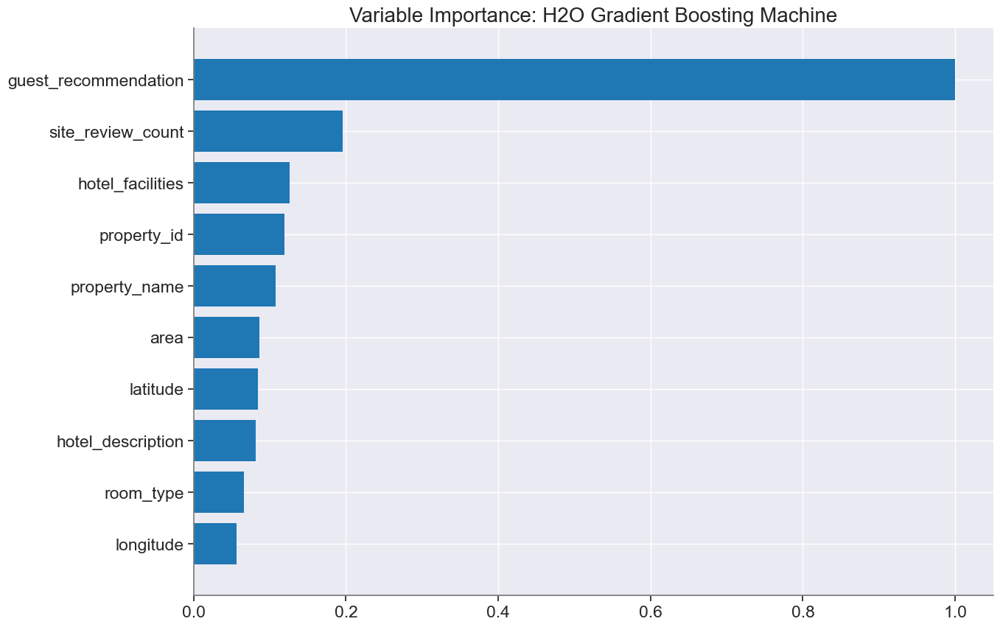

<Figure size 640x480 with 0 Axes>

In [36]:
if best_model.algo in ['gbm','drf','xrt','xgboost']:
    best_model.varimp_plot()

The variable Importance Graph on the H20's Distributed Random Forest Model is shown in the above graph.

With importance of 1.0, we can conclude that guest recommendation is the most Important Variable overall (consider this as if the importance scale is 100%).


34
glm


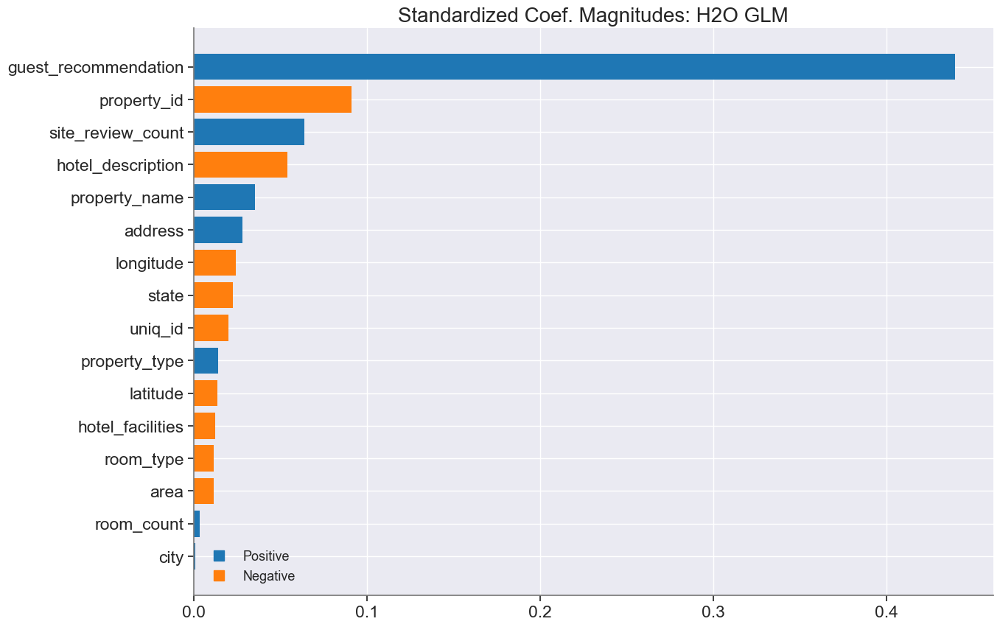

In [37]:
if glm_index is not 0:
    print(glm_index)
    glm_model = h2o.get_model(aml.leaderboard[glm_index, "model_id"])
    print(glm_model.algo)
    glm_model.std_coef_plot()

After standardizing all variables to have a mean of zero and a standard deviation of one, Standardized Coefficient Magnitudes—also known as standardized coefficients or beta coefficients—measure the significance of each input variable in a predictive model. Standardized coefficient magnitudes are usually stated as percentages, however they can have values ranging from negative infinity to positive infinity.


After accounting for the variable's scale, the values on the standardized coefficient magnitudes show the relative importance of each input variable in the model. A larger magnitude value denotes a bigger influence of the variable on the result variable, whereas a smaller value denotes a weaker influence.

Among the variables,significant features are guest_recommendation, site_review _count, and property_name, as can be seen from the findings above.


In [38]:
print(best_model.rmse(train=True))

0.4807928431550321


In [39]:
def model_performance_stats(perf):
    d = {}
    try:
        d["mse"] = perf.mse()
    except:
        pass
    try:
        d["rmse"] = perf.rmse()
    except:
        pass
    try:
        d["null_degrees_of_freedom"] = perf.null_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_degrees_of_freedom"] = perf.residual_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_deviance"] = perf.residual_deviance()
    except:
        pass
    try:
        d["null_deviance"] = perf.null_deviance()
    except:
        pass
    try:
        d["aic"] = perf.aic()
    except:
        pass
    try:
        d["logloss"] = perf.logloss()
    except:
        pass
    try:
        d["auc"] = perf.auc()
    except:
        pass
    try:
        d["gini"] = perf.gini()
    except:
        pass
    return d

In [40]:
mod_perf = best_model.model_performance(df_test)
stats_test = {}
stats_test = model_performance_stats(mod_perf)
stats_test

{'mse': 0.4879565285086315,
 'rmse': 0.6985388525405237,
 'null_degrees_of_freedom': None,
 'residual_degrees_of_freedom': None,
 'residual_deviance': None,
 'null_deviance': None}

In [41]:
predictions = best_model.predict(df_test)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [42]:
y_pred = h2o.as_list(
    predictions
)  # Predictions on Test Dataset using the best model from the leaderboard.
print(y_pred)

      predict
0    4.176989
1    4.232802
2    3.573344
3    4.272155
4    4.152424
..        ...
475  1.746651
476  3.761587
477  3.575153
478  3.670292
479  3.039753

[480 rows x 1 columns]


In [43]:
y_test = h2o.as_list(df_test[y])  # Real Answers
y_test

,site_review_rating
0,4.0
1,4.5
2,2.5
3,4.6
4,4.3
...,...
475,1.5
476,3.9
477,3.5
478,3.0


In [44]:
print(X)


['address', 'area', 'city', 'guest_recommendation', 'hotel_description', 'hotel_facilities', 'latitude', 'longitude', 'property_id', 'property_name', 'property_type', 'room_count', 'room_type', 'site_review_count', 'state', 'uniq_id']


# Regularization
This section will use the GLM model to figure out if regularization contributes to increased accuracy and less overfitting.

Regularization methods like Ridge and Lasso are applied in linear regression to mitigate overfitting and enhance the model's capacity for generalization.

The linear regression model's least-squares objective function gains a penalty term as a result of ridge regularization. The model's coefficients are shrunk toward zero by this penalty term, which is proportional to the square of their magnitude. The regularization parameter, a hyperparameter that must be adjusted for optimal performance, determines how harsh the penalty is. When a large number of the input variables are associated with one another, ridge regularization is very helpful since it can lessen the impact of these correlated variables on the model's variance.

While Lasso regularization adds a penalty term according to the absolute value of the coefficients, Ridge regularization adds a term proportional to the square of the coefficients. Lasso regularization is a useful method for feature selection since this penalty term has the ability to set some coefficients to precisely zero. Lasso can efficiently eliminate insignificant variables from the model by setting some of its coefficients to zero, which can result in a simpler and easier-to-understand model.

The kind of penalty function that is used is the primary distinction between Lasso and Ridge regularization. Whereas Lasso employs L1 regularization, Ridge uses L2 regularization. Whereas L1 regularization concentrates the penalty on a smaller subset of the most significant coefficients, L2 regularization tends to distribute the penalty equally across all coefficients. The particular situation at hand and the characteristics of the input variables will determine which approach is best.

In [45]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

hotel_glm = H2OGeneralizedLinearEstimator(
    family="gaussian", lambda_=0, compute_p_values=True, nfolds=5
)  # Elastic Net Regularization
hotel_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=0, nfolds=5
)  # RIDGE Regularization
hotel_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=1, nfolds=5
)  # LASSO Regularization
hotel_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(
    lambda_search=True
)  # Lambda Search

Using the H2O machine learning platform, this code creates two generalized linear regression models with the Ridge and Lasso regularization techniques.

The family parameter is set to "gaussian" when the H2OGeneralizedLinearEstimator class is first created, indicating that a normal (Gaussian) distribution of the response variable is assumed. Since the lambda_ argument is set to 0, regularization is not used. Since the compute_p_values parameter is set to True, the GLM model's coefficients' p-values will be calculated. Since the nfolds parameter is set to 5, five folds will be created from the data in order to do cross-validation.

The next three instances of the H2OGeneralizedLinearEstimator class are created with different settings for regularization. The second instance uses ridge regularization (alpha=0), the third instance uses lasso regularization (alpha=1), and the fourth instance uses lambda search to find the optimal value of lambda for elastic net regularization.

With the option to use lambda search for L1 and L2 regularization, this code uses H2O to generate a generalized linear regression model.



In [46]:
hotel_glm.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,None,16,16,1,py_2_sid_af25
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,0.465726,0.0173110,0.4593184,0.4602799,0.4848882,0.4812299,0.4429135
mean_residual_deviance,0.4377835,0.0528899,0.4294345,0.3742359,0.4861893,0.4967642,0.4022934
mse,0.4377835,0.0528899,0.4294345,0.3742359,0.4861893,0.4967642,0.4022934
null_deviance,237.33939,10.888168,241.81956,234.0352,239.74849,250.22658,220.86711
r2,0.326455,0.0713177,0.356779,0.4284947,0.2539121,0.2652278,0.3278613
residual_deviance,159.68994,21.036655,154.16699,133.60222,178.43147,183.80273,148.44629
rmse,0.6606829,0.0400242,0.6553125,0.6117482,0.6972727,0.704815,0.6342661
rmsle,0.1653914,0.0148257,0.1663160,0.1517089,0.1697972,0.1874119,0.1517229


# Ridge Regularization

In [47]:
hotel_glm_regularization_ridge.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Ridge ( lambda = 4.488E-4 ),16,16,1,py_2_sid_af25
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,0.4691093,0.0277710,0.4328929,0.5070531,0.4783299,0.4539242,0.4733461
mean_residual_deviance,0.4479158,0.0763797,0.3389205,0.5077742,0.4283933,0.4315788,0.5329121
mse,0.4479158,0.0763797,0.3389205,0.5077742,0.4283933,0.4315788,0.5329121
null_deviance,237.20276,30.415611,240.2302,214.8854,288.21646,214.72226,227.95949
r2,0.3087014,0.1202163,0.4576481,0.2210671,0.3977910,0.2994385,0.1675624
residual_deviance,162.12173,22.804377,130.14546,167.05771,173.49931,150.18942,189.71674
rmse,0.6672448,0.0580964,0.5821688,0.7125828,0.6545176,0.6569466,0.7300083
rmsle,0.1667788,0.0157939,0.1428142,0.1824444,0.1632023,0.1658327,0.1796002


Upon examining the performance metrics provided for the training data, we can observe that nearly all of the metrics values for the two models are the same. On the other hand, the Ridge-regularized model performs better than the non-regularized model when we examine the metrics provided for the cross-validation data. In particular, the slightly higher R-squared value and slightly lower MSE, RMSE, and RMSLE are found in the Ridge-regularized model. This implies that the model's capacity to generalize to data was enhanced by the application of Ridge regularization.

Overall, the analysis demonstrates that the model's performance on data was enhanced by the addition of Ridge regularization.

# Lasso Regularization

In [48]:
hotel_glm_regularization_lasso.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Lasso (lambda = 4.488E-4 ),16,16,1,py_2_sid_af25
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,0.4665127,0.0125286,0.4765491,0.4718294,0.4760298,0.4611143,0.4470410
mean_residual_deviance,0.4471272,0.0500541,0.4474071,0.4525531,0.4963433,0.4747194,0.3646131
mse,0.4471272,0.0500541,0.4474071,0.4525531,0.4963433,0.4747194,0.3646131
null_deviance,237.29318,16.302004,236.76973,262.10776,223.18642,242.1036,222.29842
r2,0.3100643,0.0931497,0.2873337,0.4005309,0.2199594,0.2273406,0.4151568
residual_deviance,163.06425,21.551342,168.67247,156.58336,173.2238,187.03943,129.80225
rmse,0.6677905,0.0384538,0.6688849,0.6727206,0.7045164,0.6889988,0.6038320
rmsle,0.1666622,0.0107448,0.1651091,0.1753422,0.1798592,0.1577949,0.1552055


# Which Regularization Method Helps ?

All three of the models have comparable R-squared (R²) values, which suggests that they all account for a comparable amount of variance in the target variable.

The ridge regression model's MSE, RMSE, and MAE values, however, are marginally lower than those of the other two models.

Furthermore, the AIC score of the ridge regression model is the lowest.

With the greatest RMSLE score, the lasso regression model suggests that it could not be very effective at predicting values that deviate greatly from the average.

Based on the evaluation metrics utilized, the ridge regression model seems to be the best performing model overall.





In [49]:
lambda_search = hotel_glm_regularization_lamba_search.train(
    x=X, y=y, training_frame=df_train
)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


In [50]:
lambda_search

Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1698956744439_33


GLM Model: summary
    family    link      regularization                                 lambda_search                                                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ---------------------------------------------  ----------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 0.004903 )  nlambda = 100, lambda.max = 0.8976, lambda.min = 0.004903, lambda.1se = -1.0  16                            15                             57                      py_2_sid_af25

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.4252722925465242
RMSE: 0.6521290459307301
MAE: 0.4595715007426443
RMSLE: 0.16442196579423593
Mean Residual Deviance: 0.4252722925465242
R^2: 0.3464508112277178
Null degrees of freedom: 1821
Residual degrees of freedom: 1806
Null deviance: 1185.5972439887569
Residual deviance: 774.8461170197671
AIC: 3646.7553228477686

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train       alpha    iterations    training_rmse       training_deviance    training_mae        training_r2
---  -------------------  ----------  -----------  --------  ------------  -------------------  -------  ------------  ------------------  -------------------  ------------------  ------------------
     2023-11-02 16:31:20  0.000 sec   1            .9E0      1             0.6507119864420337   0.5
     2023-11-02 16:31:20  0.001 sec   2            .82E0     2             0.6261004198447416   0.5
     2023-11-02 16:31:20  0.001 sec   3            .75E0     2             0.603941181229726    0.5
     2023-11-02 16:31:20  0.002 sec   4            .68E0     2             0.5840942503187976   0.5
     2023-11-02 16:31:20  0.002 sec   5            .62E0     2             0.5664074487876251   0.5
     2023-11-02 16:31:20  0.003 sec   6            .56E0     2             0.5507211597732279   0.5
     2023-11-02 16:31:20  0.004 sec   7            .51E0     2             0.5368725673333427   0.5
     2023-11-02 16:31:20  0.004 sec   8            .47E0     2             0.5246993293099311   0.5
     2023-11-02 16:31:20  0.005 sec   9            .43E0     2             0.5140426407031158   0.5
     2023-11-02 16:31:20  0.006 sec   10           .39E0     2             0.5047496822866794   0.5
---  ---                  ---         ---          ---       ---           ---                  ---      ---           ---                 ---                  ---                 ---
     2023-11-02 16:31:21  0.054 sec   48           .11E-1    15            0.42565676460299723  0.5
     2023-11-02 16:31:21  0.055 sec   49           .1E-1     15            0.4255786048757312   0.5
     2023-11-02 16:31:21  0.056 sec   50           .94E-2    15            0.425513532099126    0.5
     2023-11-02 16:31:21  0.057 sec   51           .86E-2    16            0.4254584166821036   0.5
     2023-11-02 16:31:21  0.057 sec   52           .78E-2    16            0.42541158436757504  0.5
     2023-11-02 16:31:21  0.057 sec   53           .71E-2    16            0.4253725871478627   0.5
     2023-11-02 16:31:21  0.058 sec   54           .65E-2    16            0.42534017993824735  0.5
     2023-11-02 16:31:21  0.058 sec   55           .59E-2    16            0.4253132519278962   0.5
     2023-11-02 16:31:21  0.058 sec   56           .54E-2    16            0.42529087841049606  0.5
     2023-11-02 16:31:21  0.059 sec   57           .49E-2    16            0.4252722903376515   0.5      57            0.6521290459307301  0.4252722925465242   0.4595715007426443  0.3464508112277178
[57 rows x 13 co

In [51]:
coeff_table = hotel_glm._model_json["output"]["coefficients_table"]

In [52]:
coeff_table.as_data_frame()  # Z-Value and P-Value showing the significance of each attributes.

,names,coefficients,std_error,z_value,p_value,standardized_coefficients
0,Intercept,2.922871,0.295951,9.876195,1.934033e-22,3.771186
1,address,0.000042,0.000024,1.778817,7.543810e-02,0.028054
2,area,-0.000044,0.000061,-0.729942,4.655203e-01,-0.011436
3,city,0.000009,0.000152,0.056914,9.546198e-01,0.000886
4,guest_recommendation,0.020115,0.000709,28.372037,9.666885e-147,0.440642
5,hotel_description,-0.000147,0.000043,-3.409929,6.641033e-04,-0.053979
6,hotel_facilities,-0.000020,0.000025,-0.770515,4.410952e-01,-0.012321
7,latitude,-0.001809,0.002118,-0.854489,3.929473e-01,-0.013569
8,longitude,-0.005442,0.003524,-1.544562,1.226274e-01,-0.024121
9,property_id,-0.000137,0.000024,-5.607878,2.365304e-08,-0.091384


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_4_AutoML_1_20231102_162732,0.691745,0.478511,0.477364,0.177977,0.478511,183,0.043993,StackedEnsemble
StackedEnsemble_AllModels_3_AutoML_1_20231102_162732,0.691797,0.478584,0.477866,0.178037,0.478584,221,0.0498,StackedEnsemble
StackedEnsemble_AllModels_6_AutoML_1_20231102_162732,0.694054,0.481711,0.480768,0.178725,0.481711,693,0.053052,StackedEnsemble
GBM_1_AutoML_1_20231102_162732,0.694383,0.482167,0.483757,0.179189,0.482167,334,0.01091,GBM
StackedEnsemble_AllModels_1_AutoML_1_20231102_162732,0.694588,0.482453,0.481335,0.178546,0.482453,159,0.031145,StackedEnsemble
GBM_grid_1_AutoML_1_20231102_162732_model_6,0.69472,0.482636,0.482684,0.178892,0.482636,125,0.012159,GBM
StackedEnsemble_BestOfFamily_2_AutoML_1_20231102_162732,0.694907,0.482895,0.481083,0.178686,0.482895,145,0.027071,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_1_20231102_162732,0.694949,0.482954,0.48042,0.178732,0.482954,165,0.025475,StackedEnsemble
GBM_grid_1_AutoML_1_20231102_162732_model_11,0.694953,0.482959,0.495748,0.179044,0.482959,110,0.013718,GBM
StackedEnsemble_BestOfFamily_1_AutoML_1_20231102_162732,0.695151,0.483235,0.479147,0.179043,0.483235,170,0.010993,StackedEnsemble


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

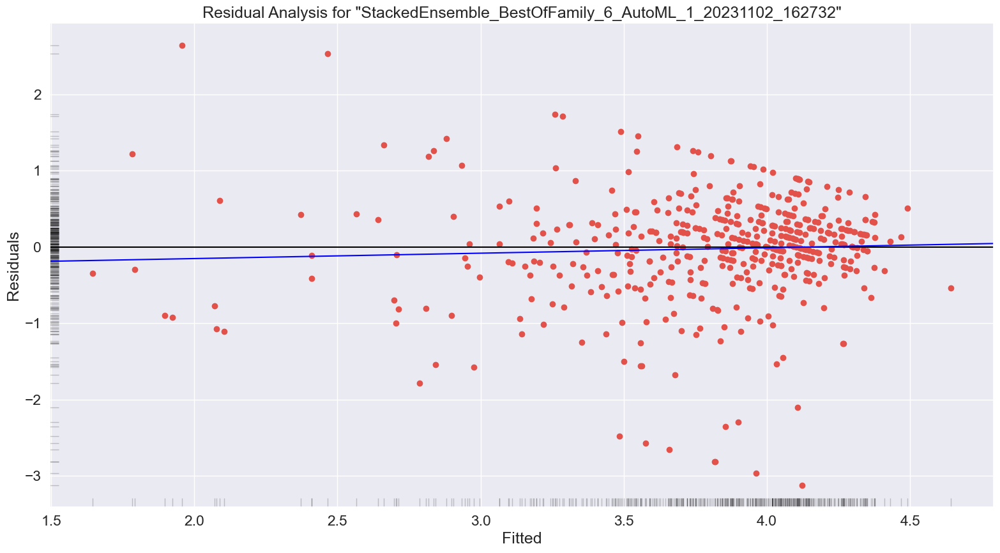

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

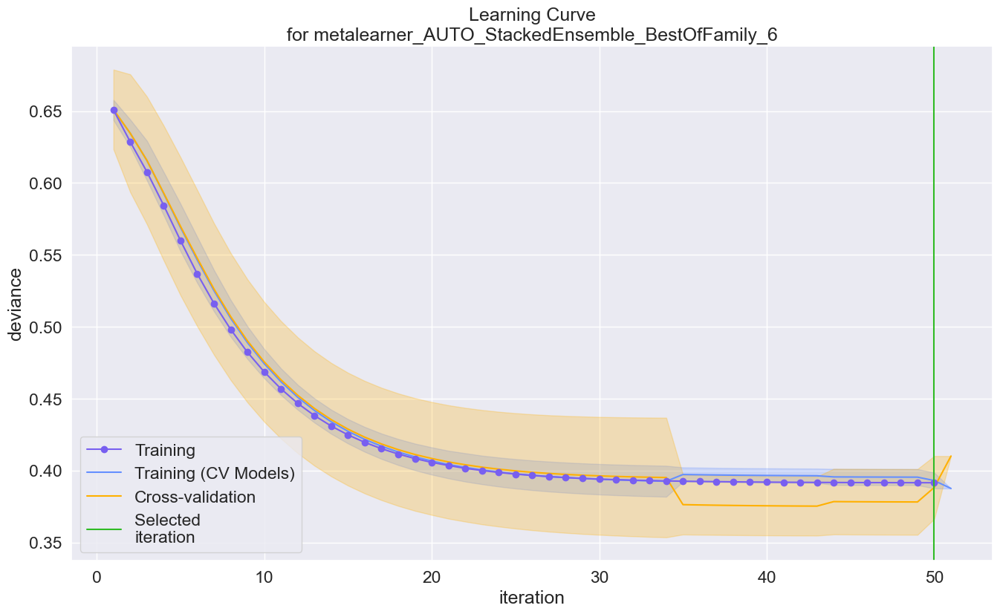

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

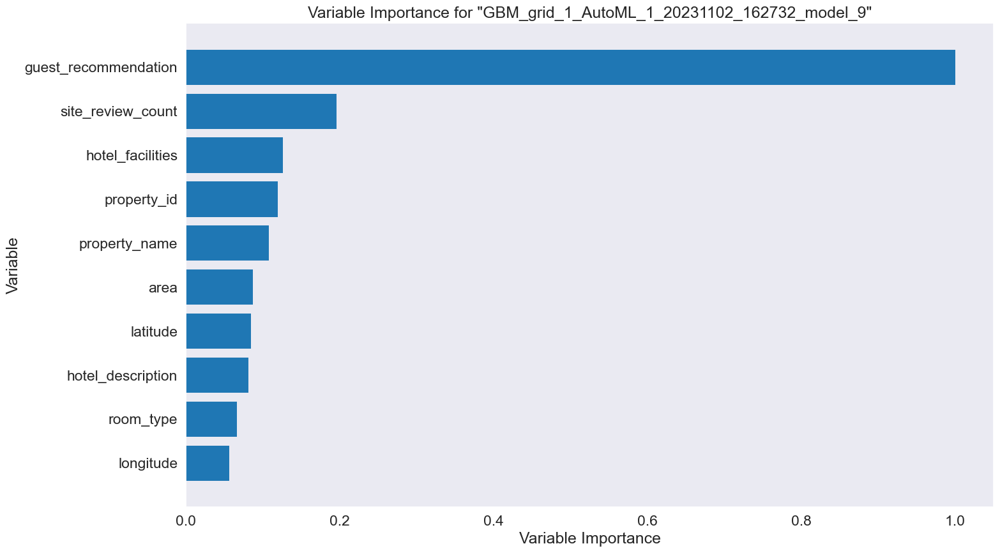

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

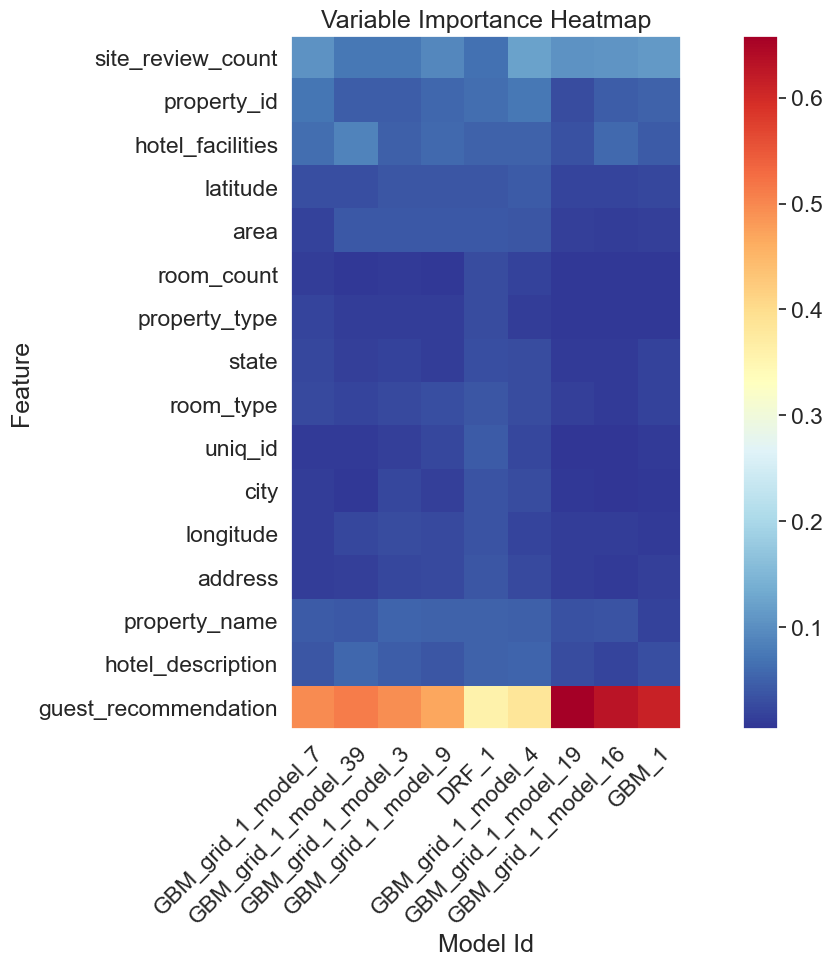

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

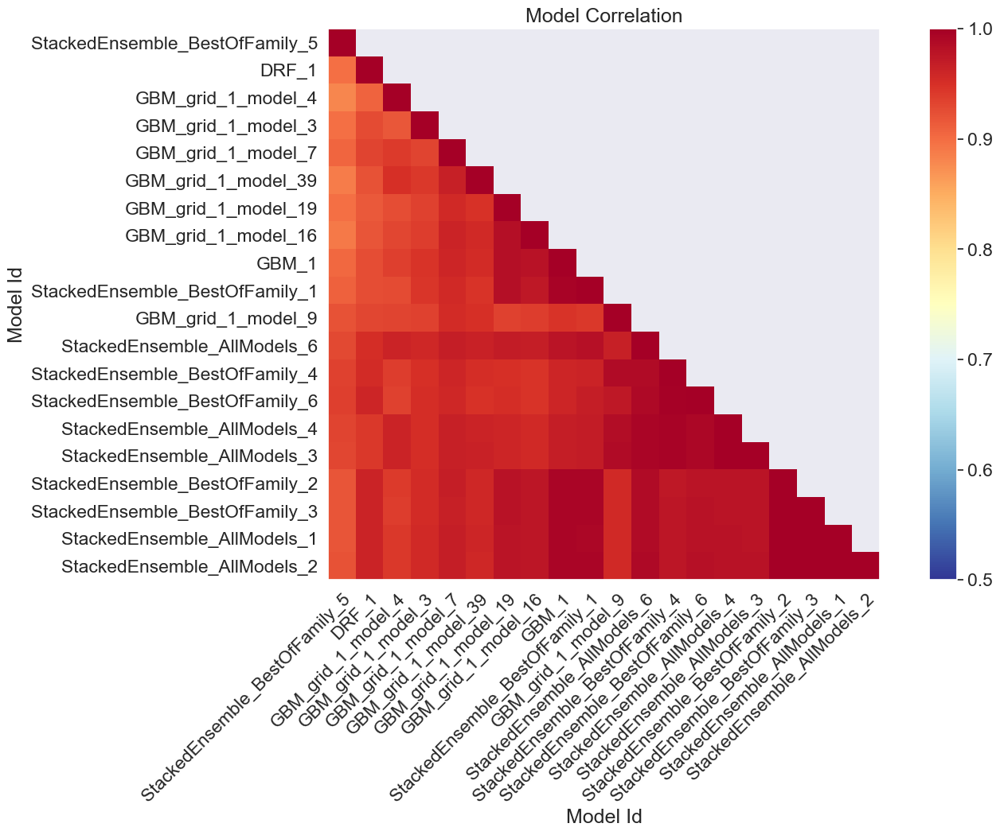

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

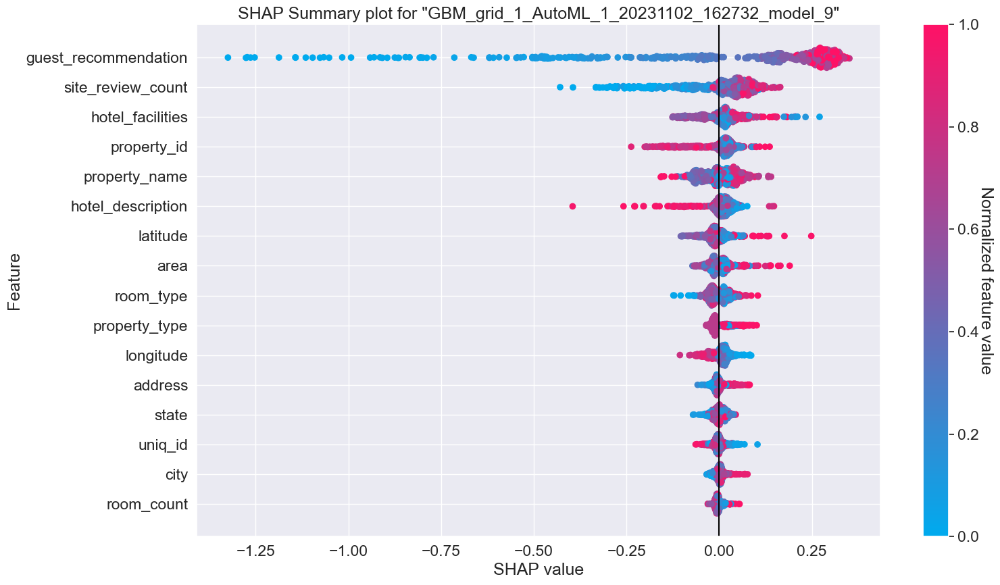

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

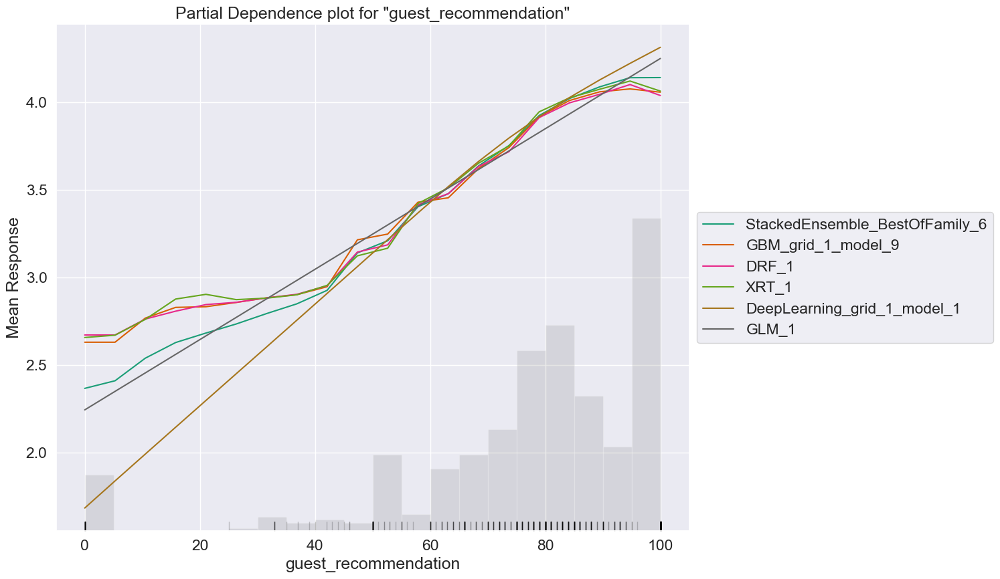

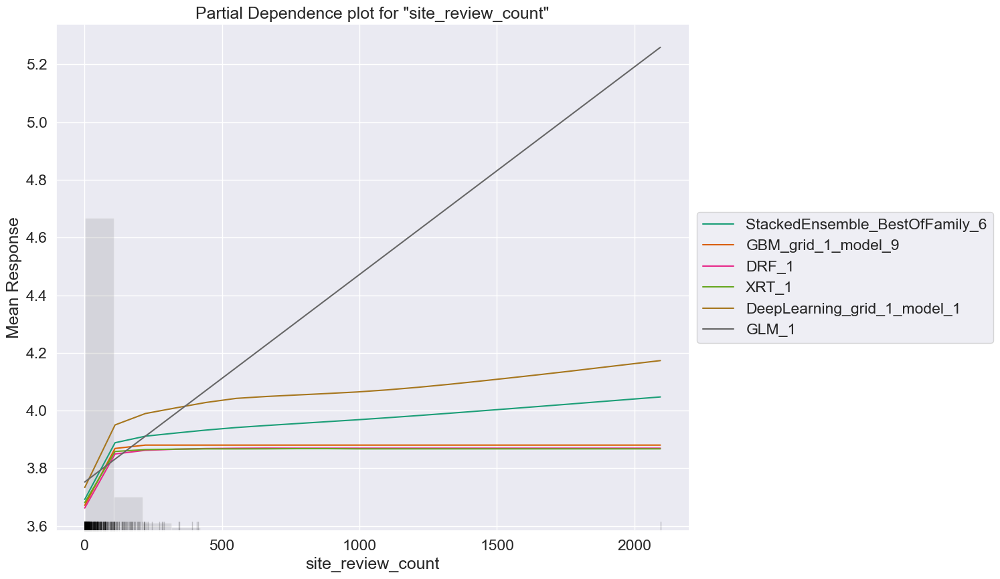

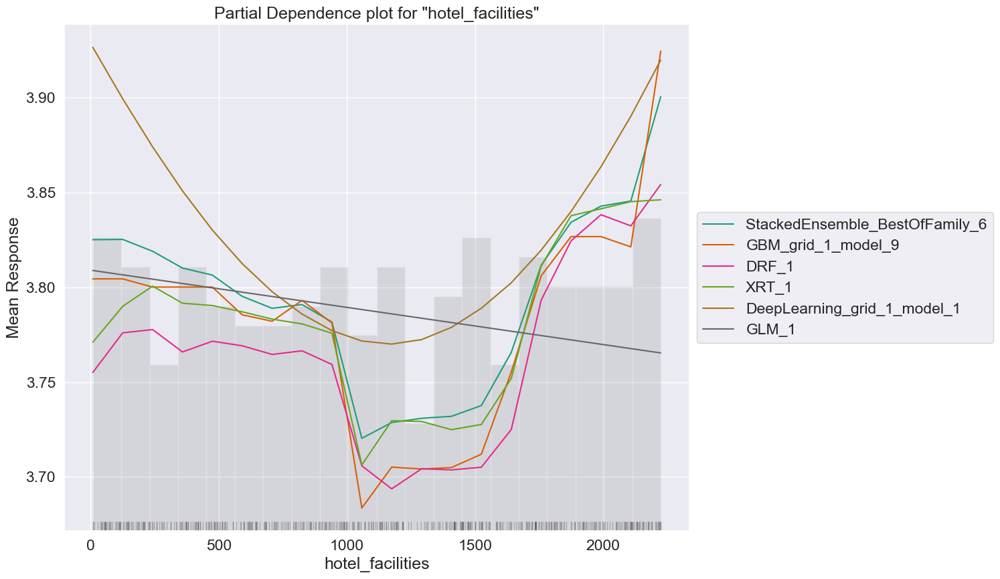

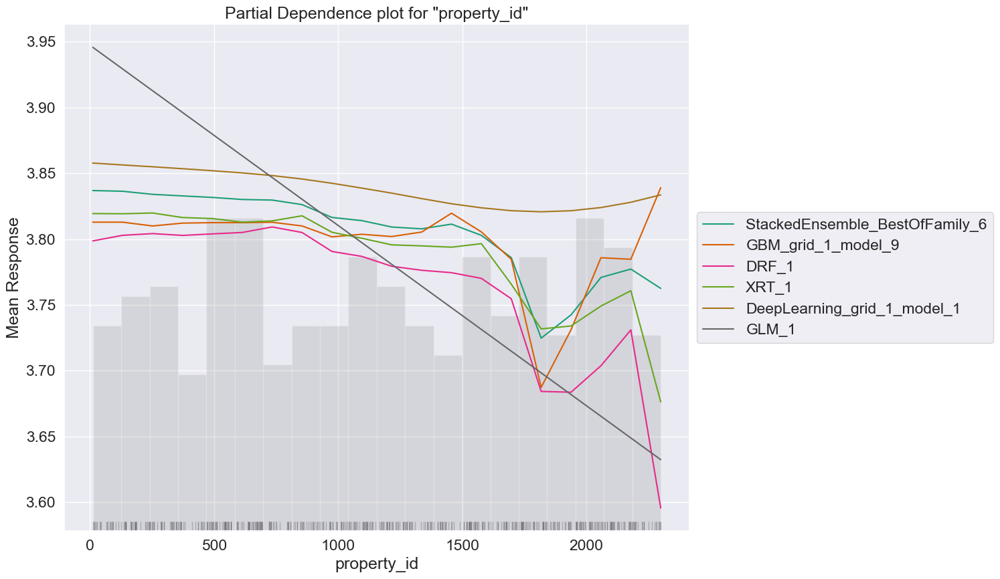

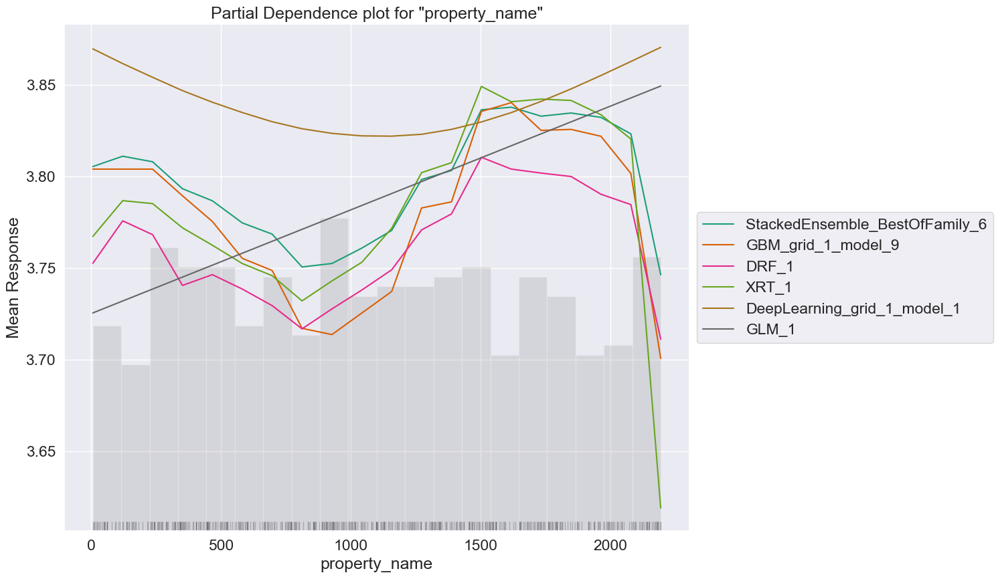

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

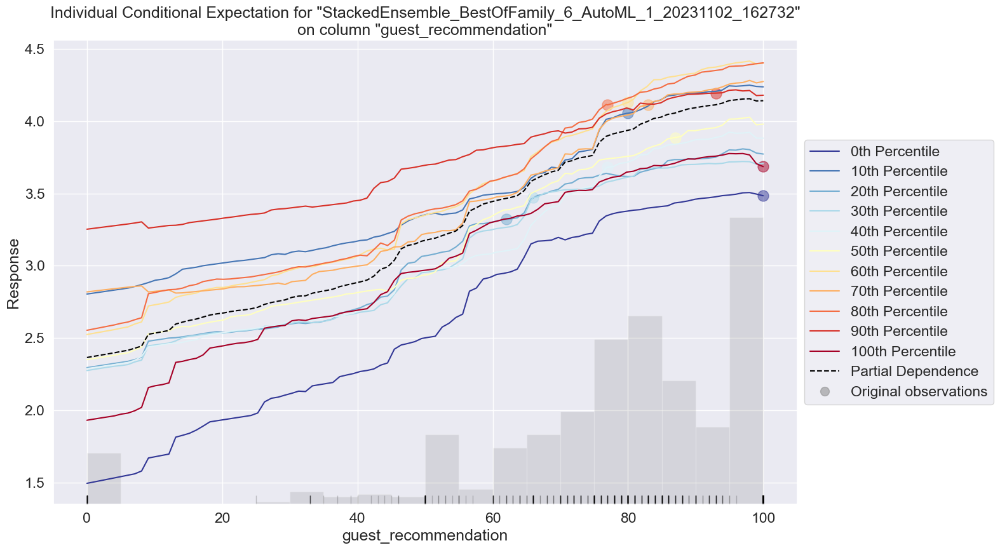

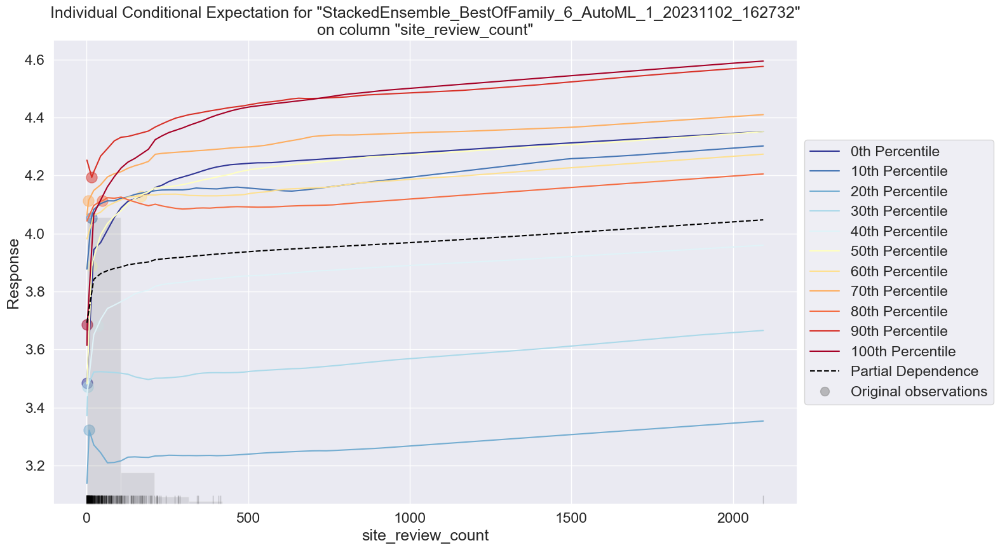

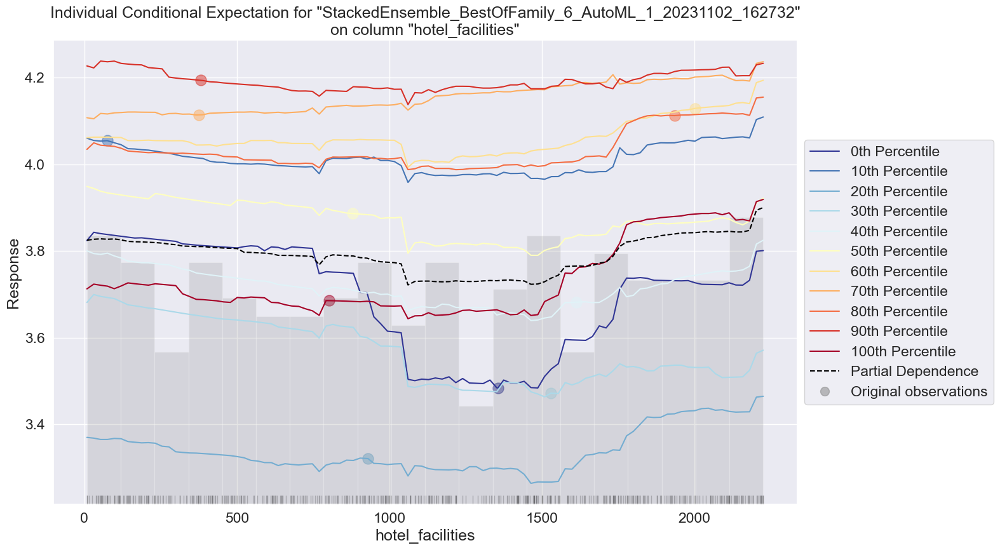

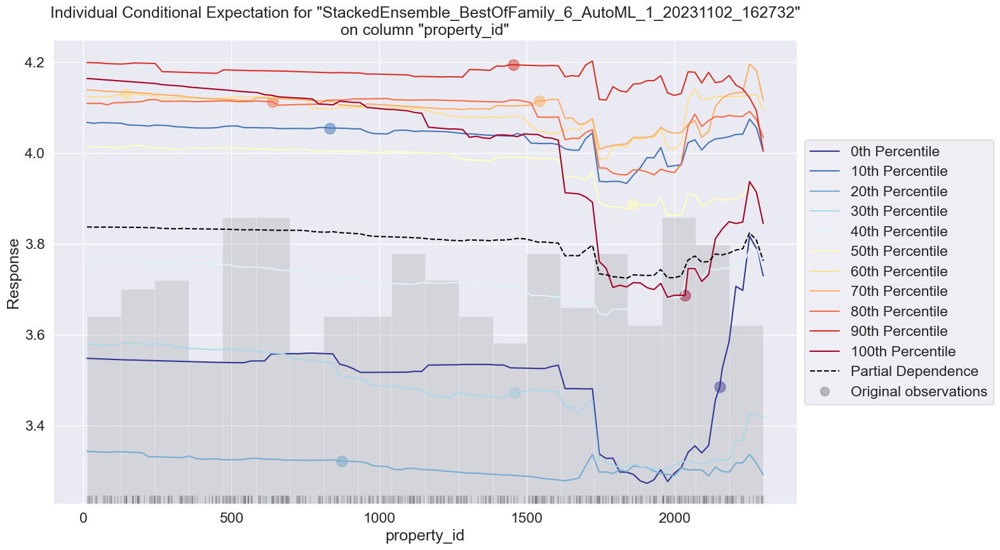

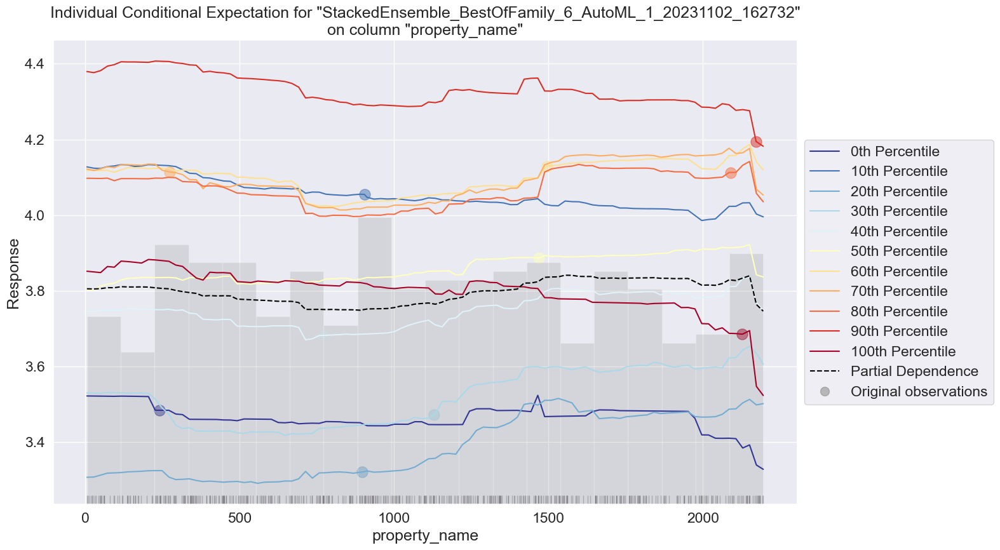

In [53]:
exa = aml.explain(df_test)

# Checking if assumptions violated

Evaluating if the model has violated any assumptions. For linear regression some of the assumptions are:

(1) The relationship between the independent and dependent variables must be linear.

(2) Homoscedasticity, or the error distribution's normalcy.A properly distributed plot of the residuals against the target variable is required.

(3) Multicollinearity in the data is assumed to be minimal or nonexistent in linear regression. When there is an excessive amount of correlation between the independent variables, multicollinearity arises.

(4) Autocorrelation ought to be negligible or absent. The Durbin-Watson test is one method for testing this. When the numbers are between 1.5 and 2.5, there is no autocorrelation.

In [54]:

#Seperating the predictor and target variables
A=dff.drop(['site_review_rating'],axis=1)
B=dff['site_review_rating']

In [55]:
#Splitting the data
A_train,A_test,b_train,b_test=tts(A,B,test_size=0.2,random_state=42)

In [56]:

cols1 = ['address','area','city','guest_recommendation','latitude','hotel_description','longitude','hotel_facilities','property_id','property_name','property_type','room_count','room_type','site_review_count','state','uniq_id']
model1 = sm.OLS(b_train,sm.add_constant(A_train[cols1])).fit()

In [57]:

b_pred = model1.predict(sm.add_constant(A_train[cols1]))

In [58]:

residuals = b_train-b_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals 4.801277367113333e-15


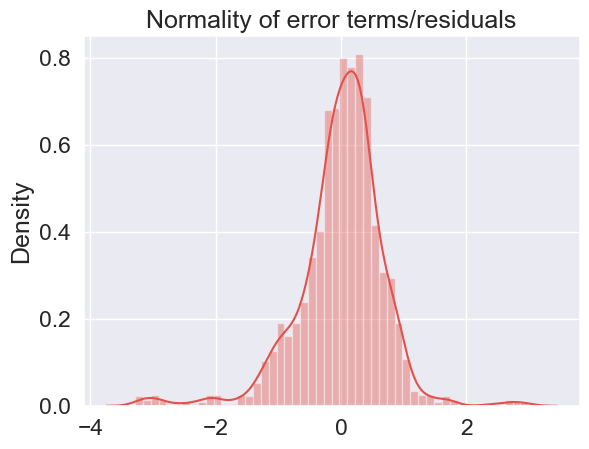

In [59]:

p = sns.distplot(residuals,kde=True)
p = plt.title('Normality of error terms/residuals')

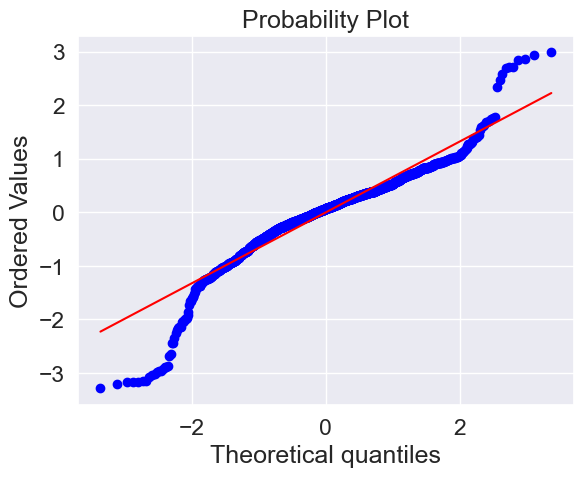

In [60]:

import pylab
import scipy.stats as stats
stats.probplot(residuals, dist="norm", plot=pylab)
pylab.show()

<Axes: xlabel='site_review_rating', ylabel='Count'>

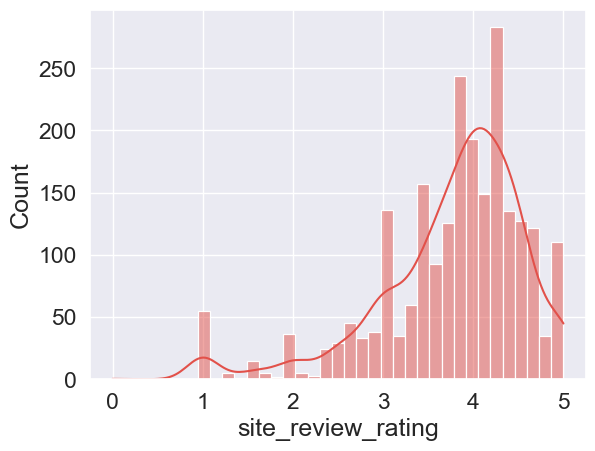

In [61]:

sns.histplot(dff.site_review_rating, kde = True)

# Analysing relation between all variables

Variance Inflation Factor(or VIF),It represents multicollinearity between a group of various independent variables. When the independent variable has a value larger than 10, it indicates a strong correlation with another variable. To verify the dependency, the VIF values for each variable will be calculated. The variables with the highest VIF values will then be dropped.



In [62]:
import statsmodels.formula.api as smf  # OLS model Library

In [63]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Indicate which variables to compute VIF
Multic = dff[['address','area','city','guest_recommendation','latitude','hotel_description','longitude','hotel_facilities','property_id','property_name','property_type','room_count','room_type','site_review_count','state','uniq_id']]
#Compute VIF
vif = pd.DataFrame()
vif["variables"] = Multic.columns
vif["VIF"] = [variance_inflation_factor(Multic.values, i) for i in range(Multic.shape[1])]
vif


,variables,VIF
0,address,4.225448
1,area,4.190047
2,city,3.683299
3,guest_recommendation,12.464634
4,latitude,9.433637
5,hotel_description,5.131408
6,longitude,52.003115
7,hotel_facilities,4.447116
8,property_id,4.440623
9,property_name,4.087201


In [64]:
import h2o

pandas_df = h2o.as_list(df)

A statistical method known as ordinary least squares (OLS) regression is applied to multivariate models to estimate the relationship between one or more independent variables and a dependent variable. The relationship is estimated by minimizing the sum of squares in the difference between the dependent variable's predicted and observed values.

In [65]:
results = smf.ols(
    "site_review_rating ~ area + city + guest_recommendation + latitude + hotel_facilities + address + hotel_description + longitude + property_id + property_name + property_type + room_count + room_type + site_review_count + state + uniq_id",
    data=pandas_df,
).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     site_review_rating   R-squared:                       0.332
Model:                            OLS   Adj. R-squared:                  0.327
Method:                 Least Squares   F-statistic:                     70.89
Date:                Thu, 02 Nov 2023   Prob (F-statistic):          2.40e-186
Time:                        16:32:45   Log-Likelihood:                -2344.8
No. Observations:                2302   AIC:                             4724.
Df Residuals:                    2285   BIC:                             4821.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                2.6847      0.269      9.987      0.000       2.158       3.212
area                 -5.007e-05   5.54e-05     -0.904      0.366      -0.000    5.86e-05
city                  7.838e-05      0.000      0.565      0.572      -0.000       0.000
guest_recommendation     0.0199      0.001     31.030      0.000       0.019       0.021
latitude                -0.0009      0.002     -0.471      0.638      -0.005       0.003
hotel_facilities     -3.532e-05    2.3e-05     -1.533      0.126   -8.05e-05    9.87e-06
address               1.205e-05   2.17e-05      0.554      0.580   -3.06e-05    5.47e-05
hotel_description       -0.0002   3.95e-05     -4.485      0.000      -0.000   -9.97e-05
longitude               -0.0015      0.003     -0.480      0.632      -0.008       0.005
property_id             -0.0001   2.23e-05     -6.456      0.000      -0.000      -0.000
property_name         6.339e-05   2.26e-05      2.806      0.005    1.91e-05       0.000
property_type            0.0026      0.006      0.464      0.643      -0.008       0.013
room_count            4.577e-05      0.000      0.408      0.683      -0.000       0.000
room_type            -4.836e-05   6.09e-05     -0.794      0.427      -0.000    7.11e-05
site_review_count        0.0006      0.000      4.013      0.000       0.000       0.001
state                   -0.0023      0.002     -1.085      0.278      -0.006       0.002
uniq_id              -2.969e-05   2.12e-05     -1.403      0.161   -7.12e-05    1.18e-05
==============================================================================
Omnibus:                      474.346   Durbin-Watson:                   1.996
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2469.727
Skew:                          -0.876   Prob(JB):                         0.00
Kurtosis:                       7.762   Cond. No.                     5.35e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.35e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# Hyperparameter Tuning

Hyperparameter tuning is used to determine the optimal hyperparameter setting and combinations of interacting hyperparameters for a given dataset. It selects a subset of values for the model hyperparameters that yields the greatest performance on a particular dataset after objectively searching through a variety of possibilities.

In [66]:

s = dff['site_review_rating']

t = dff.drop(['site_review_rating'], axis = 1)

In [67]:
import numpy as np

from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import RandomizedSearchCV

In [68]:

t_train, t_test, s_train, s_test = train_test_split (t, s, random_state = 101, test_size = 0.2)

Here we use RandomizedSearchCV to get the best params inorder to acheive the optimal results

In [69]:
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestRegressor

mode = RandomForestRegressor()

param_vals = {'max_depth': [200, 500, 800, 1100], 'n_estimators': [100,200, 300, 400], 'min_samples_split' : [2,3,5]

}

random_rf = RandomizedSearchCV(estimator=mode, param_distributions=param_vals,

n_iter=10, scoring='accuracy', cv=5,

refit=True, n_jobs=-1)

#Training and prediction



random_rf.fit(t_train, s_train)

preds = random_rf.best_estimator_.predict(t_test)

In [70]:

random_rf.best_params_

{'n_estimators': 300, 'min_samples_split': 2, 'max_depth': 800}

## Conclusion

To predict hotel pricing, a model based on regression analysis was created. In order to eliminate a few of the independent variables, p-values and VIF tests were used. The hotel dataset variables on goibibo were trained and tested using the H20.ai framework. On the test data, the 'gbm' model produced the maximum accuracy of 51%. The results show that, although the suggested linear regression model may assess and forecast hotel ratings to some extent, there are still situations where the predicted accuracy is not very high. The model's performance can be improved by looking into other models and employing booster techniques to get rid of outliers.

# Assignment Question/Answers

Q1)Is the relationship significant?

We can look at the p-values in the table to see if there is a significant relationship between the variables.A variable is deemed statistically significant if its p-value is low, usually less than 0.05, indicating that there is proof linking it to the response variable (hotel rating in this example). The guest recommendation, property id, property name, and site review count all have extremely low p-values (less than 0.05) when compared to the other OLS method p-values, suggesting that they are statistically significant and related to site review rating.
Higher p-values for the remaining variables—area, city, latitude, longitude, property_type, room_count, room_type, state, and uniq_id—mean that they are not statistically significant or that their association to hotel rating is not very strong.

Q2)Are any model assumptions violated?

1.Linear relationship- By holding other variables constant, the dependent and independent variable's graph must be linear. A linear relationship is seen for a few of the independent variables when the target variable is plotted against all of the others. Thus, there is no violation of this assumption.

2.Homoscedasticity which means normality of the error distribution - The plot for residuals should be normally distributed i.e., it should form a bell-curve shape. The same is achieved with this model.

3.No or little multicollinearity- This can be determined by correlation matrix. For this model some of the assumptions are violated. Multicollinearity exists between

4.The Durbin-Watson test yields no autocorrelation results. A value of 1.5 to 2.5 indicates the absence of autocorrelation. Since the value for this model is 1.996, there is no violation of this assumption.

Q3)Is there any multicollinearity in the model?

Multicollinearity occurs in the model when there is a relationship between two independent variables that are highly correlated. It's problematic since it calls into question an independent variable's statistical significance. Computing correlation matrix or the VIF value of every variable can be used to calculate Multicollinearity. A correlation matrix's coefficient that is closer to +1 or -1 indicates a strong degree of connection between the two variables. A VIF value greater than 10 indicates the presence of multicollinearity. Certain variables in this model had p values larger than 0.05 and VIF values more than 10.

Q4)In the multivariate models are predictor variables independent of all the other predictor variables?

When there is no relationship between variables, they are referred to as independent. Correlation matrices can be used to examine this relationship, or graphs can be used to see whether a pattern is being followed or not. The correlation between guest_recommendation and site_review_rating is shown to be substantially correlated when the correlation matrix for the model is generated. The remaining predictions, except for those, are unrelated to one another.

Q5)In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.

From the variable importance plot, the most to least important variables are displayed. The top four factors in my model that affect site_review_ratings are guest_recommendation, property_id, site_review_count, and hotel_facilities.

Q6)Does the model make sense?

A model must have a p value and a VIF that are inside their respective ranges and adhere to all the assumptions in order to be logical. Taking into account the target variable's minimum and maximum values, the RMSE should be as low as possible. In addition, R2 is 0.67, which is regarded as acceptable accuracy. Thus, the model makes sense in general. Depending on how important they are, additional variables can be omitted to improve accuracy. Moreover, outliers can be eliminated, boosted, or an ensemble model can be applied.

Q7)Does regularization help?

This question is answered above.

Q8)Which independent variables are significant?

A p-value of less than 0.05 indicates that a variable is significant. For this model except for guest_recommendation, property_id, property_name, hotel_description and site_review_count all other variables have p-value greater than 0.05. So, it can be said that all those variables are not significant.

Q9)Which hyperparameters are important?

To find best set a hyperparameter and combinations of interacting hyperparameters for a given dataset hyperparameters tuning is used. It selects a subset of values for the model hyperparameters that yields the greatest performance on a particular dataset after objectively searching through a variety of possibilities. The RandomForestRegressor is used to tune this model. 'max_depth': 200, 'min_samples_split': 2, and 'n_estimators': 100 are the ideal hyperparameters for this model.


## REFERENCES

W3schools

Generate 'n' unique random numbers within a range

A Complete Guide to Dealing with Missing values in Python

H20.ai- https://docs.h2o.ai/

OLS Model- http://net-informations.com/ds/mla/ols.html

Linear Regression- https://www.analyticsvidhya.com/blog/2021/05/all-you-need-to-know-about-your-first-machine-learning-model-linear-regression/

Linear Regression Assumptions- https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/assumptions-of-linear-regression/

Professor's AutoML Notebook-  https://github.com/aiskunks/YouTube/tree/main/A_Crash_Course_in_Statistical_Learning/AutoML 

Github link provided by professor- https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb 